# **Data Preprocessing and Augmentation**

**Preprocessing**

In [1]:
# Connect with Google drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install tensorflow opencv-python matplotlib

**Import Necessary Libraries**

In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, save_img
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf


**Load the Dataset**

In [ ]:
dataset_path = '/content/drive/MyDrive/30124033/WildAfrica/WildAfrica'

# List classes
classes = os.listdir(dataset_path)
print("Classes:", classes)

Classes: ['elephants', 'giraffes', 'rhinos', 'buffalo', 'zebras']


**Bounding Box Validation and Visualization**

Validate and visualize dataset annotations before augmentation for accuracy.

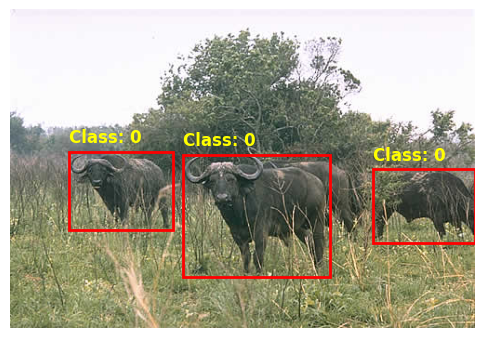

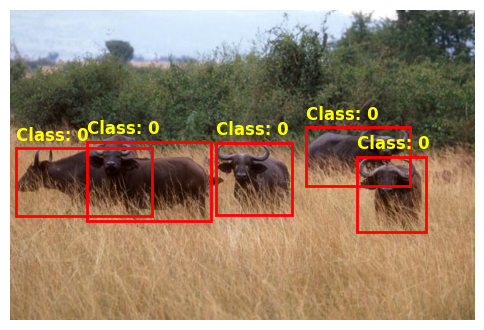

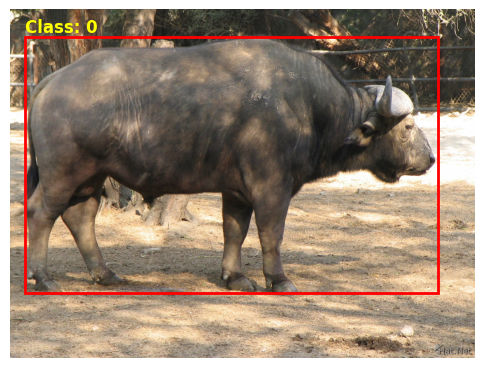

In [3]:
# original dataset path
dataset_path = '/content/drive/MyDrive/30124033/WildAfrica/WildAfrica'

def display_image_with_annotations(image_path, annotation_path=None):
    """
    Displays an image and overlays its bounding box annotations, if available.
    This helps validate the dataset's integrity and annotations.

    Parameters:
    - image_path: Path to the image file.
    - annotation_path: Path to the annotation file containing bounding box details.
    """
    # Load and display the image
    image = Image.open(image_path).convert('RGB')
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis('off')

    # If annotation file exists, overlay bounding boxes on the image
    if annotation_path and os.path.exists(annotation_path):
        with open(annotation_path, 'r') as f:
            annotations = f.readlines()

        # Draw bounding boxes
        for annotation in annotations:
            parts = annotation.strip().split()
            class_id, cx, cy, w, h = map(float, parts)  # Parse class ID and bounding box coordinates
            cx, cy, w, h = cx * image.width, cy * image.height, w * image.width, h * image.height

            # Convert center coordinates (cx, cy) to rectangle coordinates
            x1, y1 = cx - w / 2, cy - h / 2
            x2, y2 = cx + w / 2, cy + h / 2

            # Draw the bounding box
            plt.gca().add_patch(plt.Rectangle((x1, y1), w, h, edgecolor='red', facecolor='none', lw=2))
            # Add class label as text
            plt.text(x1, y1 - 10, f'Class: {int(class_id)}', color='yellow', fontsize=12, weight='bold')

    plt.show()

# Validate images and annotations for a specific class (e.g., buffalo)
class_path = os.path.join(dataset_path, 'buffalo')
image_files = [f for f in os.listdir(class_path) if f.endswith('.jpg')]

# Display the first three images with their bounding box annotations
for img_file in image_files[:3]:
    img_path = os.path.join(class_path, img_file)
    ann_path = os.path.splitext(img_path)[0] + '.txt'  # Corresponding annotation file
    display_image_with_annotations(img_path, ann_path)


**Data Augmentation**

Rotation, Horizontal Flip, Zooming, Brightness Adjustment

In [ ]:
def augment_dataset(input_dir, output_dir):
  # Apply data augmentation to the dataset

  datagen = ImageDataGenerator(
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      brightness_range=[0.8, 1.2],
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest'
  )

  for root, dirs, files in os.walk(input_dir):
    for filename in files:
      if filename.endswith(('.png', '.jpg', '.jpeg')):
        input_file_path = os.path.join(root, filename)

        # Create corresponding subfolder structure in output directory
        relative_path = os.path.relpath(root, input_dir)
        output_subfolder = os.path.join(output_dir, relative_path)
        if not os.path.exists(output_subfolder):
          os.makedirs(output_subfolder)

        # Perform Augmentation
        img = load_img(input_file_path) # Load image
        img_array = img_to_array(img) # Convert to array
        img_array = img_array.reshape((1,) + img_array.shape) # Reshape for generator

        prefix = os.path.splitext(filename)[0] # Extract filename
        i = 0
        for batch in datagen.flow(img_array, batch_size=1, save_to_dir=output_subfolder, save_prefix=prefix, save_format='jpg'):
          i += 1
          if i >= 5: # Generate 5 augmented images per input image
              break





In [ ]:
# Execute the Example

augment_dataset(input_dir="/content/drive/MyDrive/30124033/WildAfrica/WildAfrica", output_dir="/content/drive/MyDrive/30124033/WildAfrica_processed/Augmented")

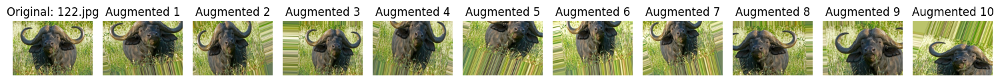

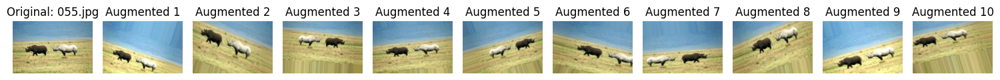

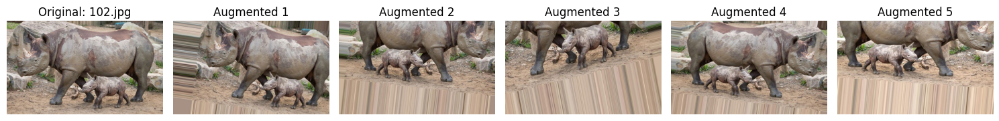

In [ ]:
import random
from collections import defaultdict

def collect_augmented_images_with_subfolders(augmented_dir):
    """
    Collect augmented images into a dictionary indexed by subfolder and filename prefix for efficient lookup.
    """
    augmented_dict = defaultdict(lambda: defaultdict(list))

    # Traverse augmented directory and organize by subfolder and filename prefix
    for subdir, dirs, files in os.walk(augmented_dir):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                full_path = os.path.join(subdir, file)
                # Extract the relative subfolder and filename prefix
                relative_subfolder = os.path.relpath(subdir, augmented_dir)
                prefix = file.split('_')[0]  # Extract prefix (e.g., '036' from '036_0_8169.jpg')
                augmented_dict[relative_subfolder][prefix].append(full_path)

    return augmented_dict

def visualize_original_and_all_augmented(original_dir, augmented_dir, num_images=3):
    """
    Visualize original images alongside all their augmented versions.
    """
    # Collect all original image paths
    all_original_paths = []
    for subdir, dirs, files in os.walk(original_dir):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                all_original_paths.append(os.path.join(subdir, file))

    # Collect augmented images into a dictionary
    augmented_dict = collect_augmented_images_with_subfolders(augmented_dir)

    # Randomly sample images
    selected_original_images = random.sample(all_original_paths, num_images)

    for original_path in selected_original_images:
        plt.figure(figsize=(15, 5))

        # Load the original image
        original_img = cv2.imread(original_path)
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # Convert to RGB

        # Determine the relative subfolder and prefix
        relative_subfolder = os.path.relpath(os.path.dirname(original_path), original_dir)
        original_filename = os.path.basename(original_path)
        original_prefix = os.path.splitext(original_filename)[0]  # e.g., '036'

        # Get augmented images for this subfolder and prefix
        matching_augmented_paths = augmented_dict[relative_subfolder].get(original_prefix, [])

        # Plot the original image
        plt.subplot(1, len(matching_augmented_paths) + 1, 1)
        plt.imshow(original_img)
        plt.title(f"Original: {original_filename}")
        plt.axis('off')

        # Plot all augmented images
        for idx, augmented_path in enumerate(matching_augmented_paths):
            augmented_img = cv2.imread(augmented_path)
            augmented_img = cv2.cvtColor(augmented_img, cv2.COLOR_BGR2RGB)  # Convert to RGB
            plt.subplot(1, len(matching_augmented_paths) + 1, idx + 2)
            plt.imshow(augmented_img)
            plt.title(f"Augmented {idx + 1}")
            plt.axis('off')

        plt.tight_layout()
        plt.show()

# Paths to the original and augmented image directories
original_directory = "/content/drive/MyDrive/30124033/WildAfrica"
augmented_directory = "/content/drive/MyDrive/30124033/WildAfrica_processed/Augmented"

# Visualize original and all augmented images
visualize_original_and_all_augmented(original_directory, augmented_directory, num_images=3)



**Noise Reduction**

Remove noise from augmented images using Gaussian blur

In [ ]:
def reduce_noise(image_path, save_path):
    """
    Applies Gaussian blur to reduce noise in an image.

    Parameters:
        image_path (str): Path to the input image.
        save_path (str): Path to save the denoised image.
    """
    # Load the image
    img = cv2.imread(image_path)
    if img is not None:  # Ensure the image is loaded successfully
        # Apply Gaussian blur to reduce noise
        denoised_img = cv2.GaussianBlur(img, (5, 5), 0)
        # Save the denoised image
        cv2.imwrite(save_path, denoised_img)
    else:
        print(f"Image not loaded: {image_path}")

def noise_reduction_dataset(input_dir, output_dir):
    """
    Applies noise reduction to all images in a dataset and saves results.

    Parameters:
        input_dir (str): Path to the dataset directory.
        output_dir (str): Path to the output directory.
    """
    for root, _, files in os.walk(input_dir):  # Traverse input directory
        for filename in files:
            # Process only valid image files
            if filename.endswith(('.png', '.jpg', '.jpeg')):
                input_file_path = os.path.join(root, filename)

                # Recreate the subfolder structure in the output directory
                relative_path = os.path.relpath(root, input_dir)
                output_subfolder = os.path.join(output_dir, relative_path)
                os.makedirs(output_subfolder, exist_ok=True)  # Ensure subfolder exists

                # Construct the full output path for the denoised image
                output_file_path = os.path.join(output_subfolder, filename)

                # Apply noise reduction to the image
                reduce_noise(input_file_path, output_file_path)

# Specify input and output directories
input_dir = "/content/drive/MyDrive/30124033/WildAfrica_processed/Augmented"
output_dir = "/content/drive/MyDrive/30124033/WildAfrica_processed/Denoised"

# Apply noise reduction to the dataset
noise_reduction_dataset(input_dir, output_dir)
print("Noise reduction completed.")



Noise reduction completed.


**Visualized With Sample images**

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/elephants/062.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/elephants/062_0_5619.jpg


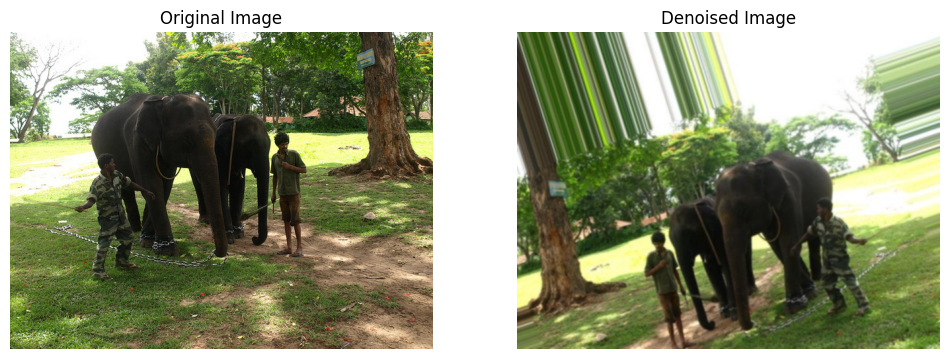

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/elephants/056.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/elephants/056_0_4900.jpg


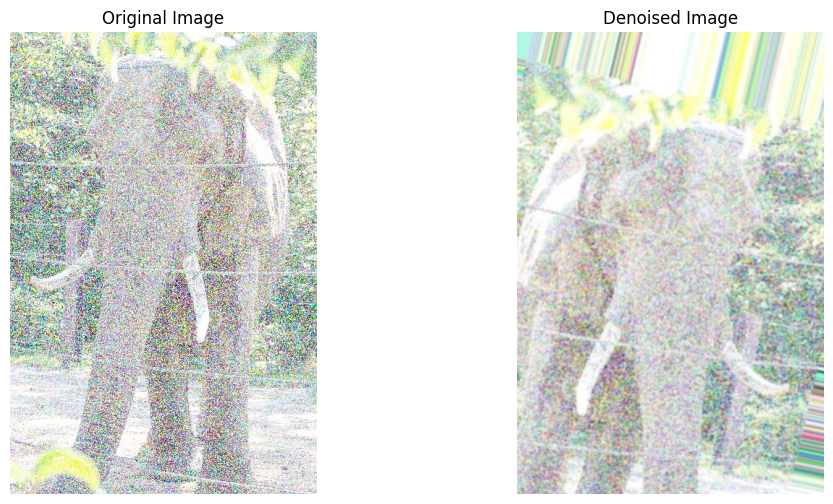

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/elephants/051.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/elephants/051_0_3401.jpg


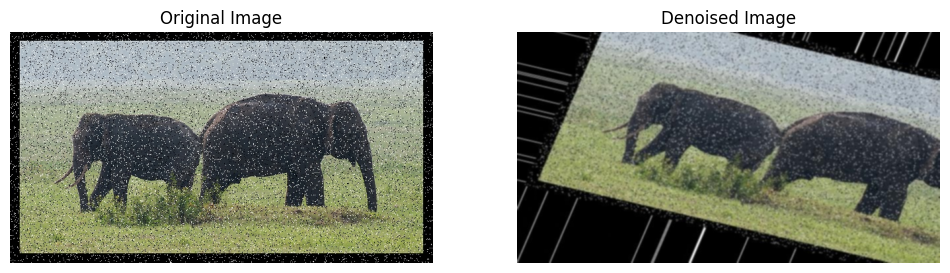

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/giraffes/Giraffe_194.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/giraffes/Giraffe_194_0_7922.jpg


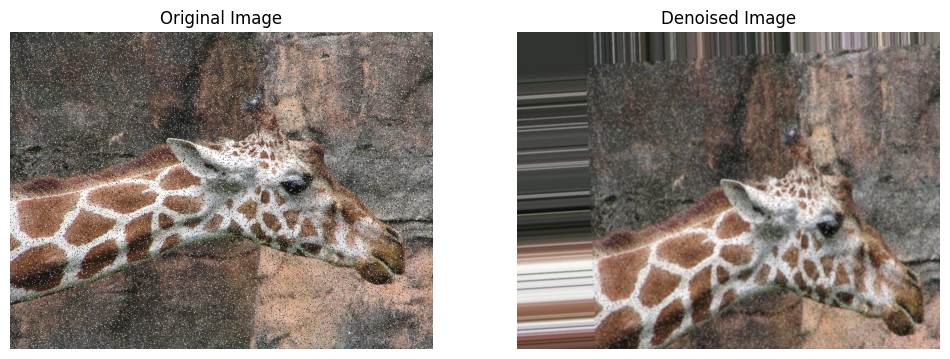

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/giraffes/Giraffe_177.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/giraffes/Giraffe_177_0_9518.jpg


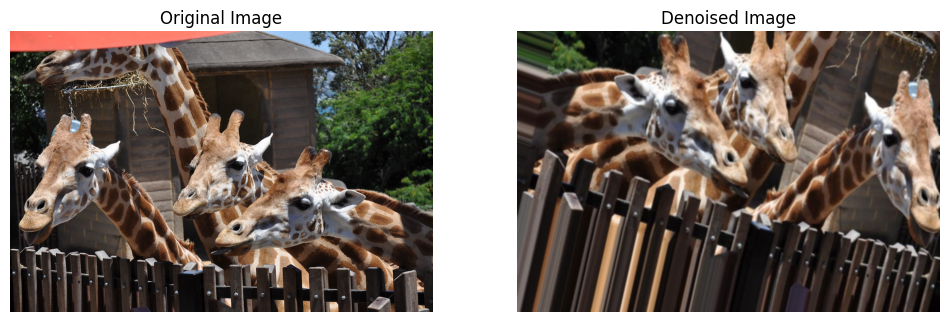

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/giraffes/Giraffe_141.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/giraffes/Giraffe_141_0_6789.jpg


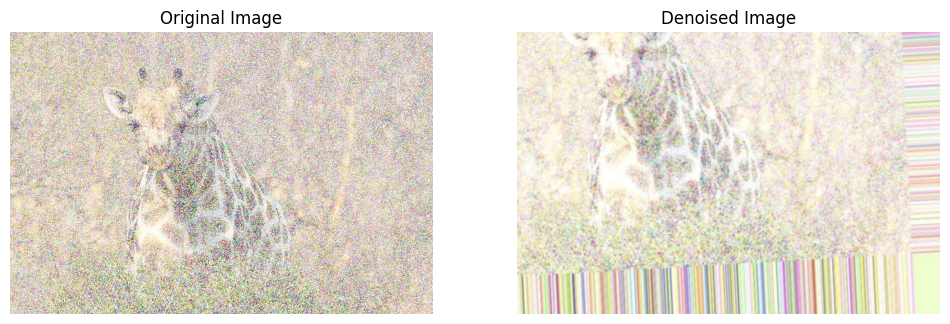

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/rhinos/013.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/rhinos/013_0_2791.jpg


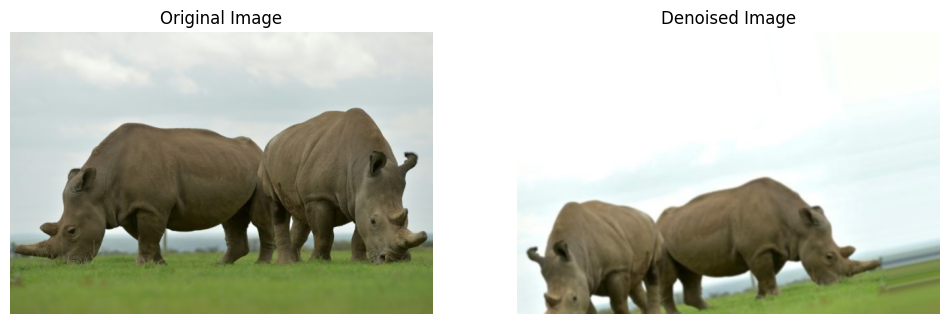

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/rhinos/011.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/rhinos/011_0_1097.jpg


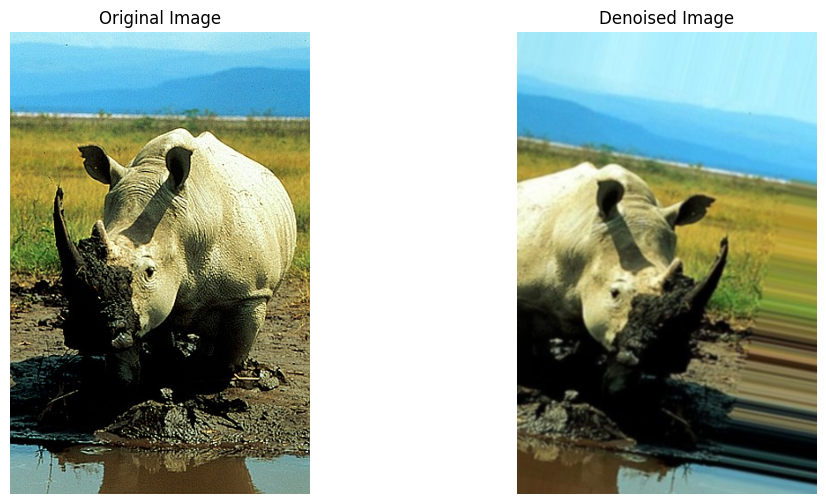

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/rhinos/008.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/rhinos/008_0_5184.jpg


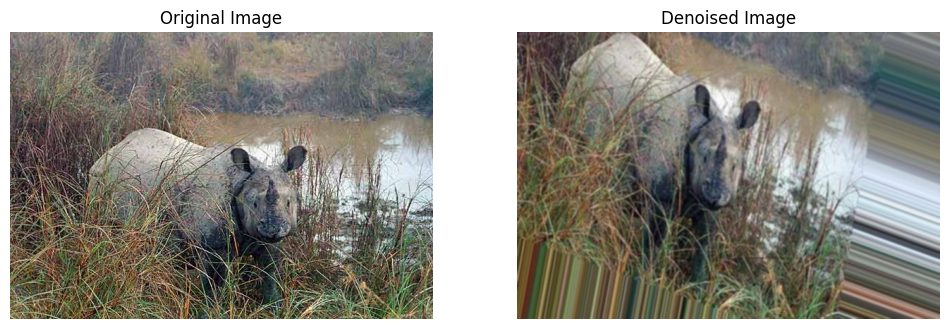

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/buffalo/005.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/buffalo/005_0_1807.jpg


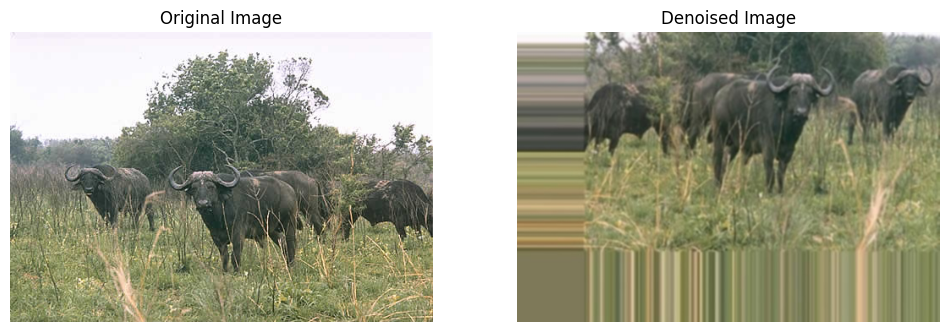

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/buffalo/003.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/buffalo/003_0_7356.jpg


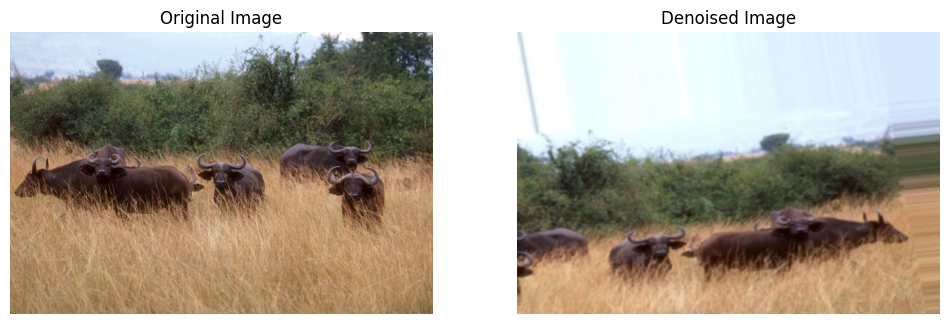

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/buffalo/008.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/buffalo/008_0_6309.jpg


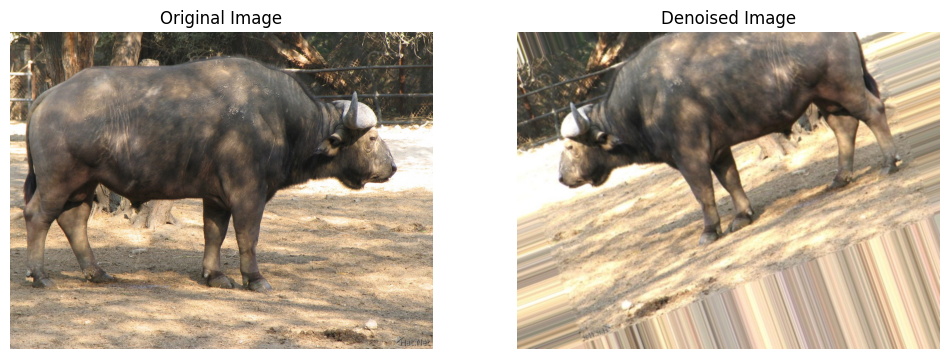

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/zebras/001.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/zebras/001_0_9656.jpg


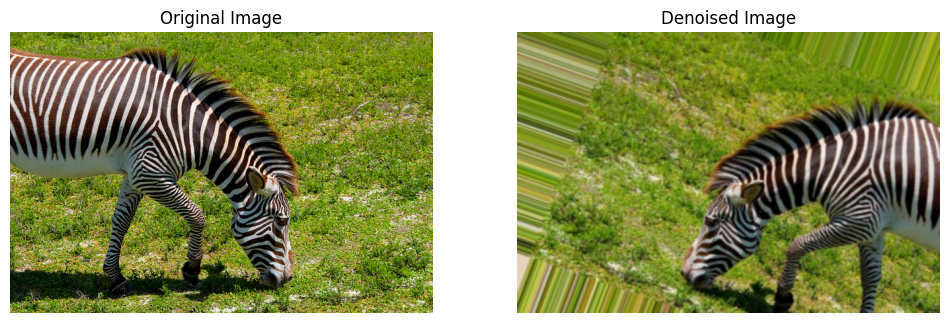

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/zebras/002.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/zebras/002_0_8383.jpg


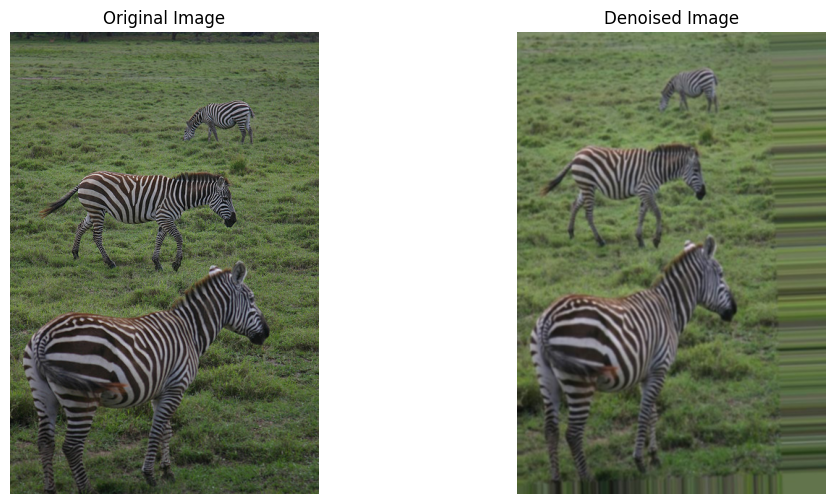

Original Image Path: /content/drive/MyDrive/30124033/WildAfrica/WildAfrica/zebras/010.jpg
Denoised Image Path: /content/drive/MyDrive/30124033/WildAfrica_processed/Denoised/zebras/010_0_4400.jpg


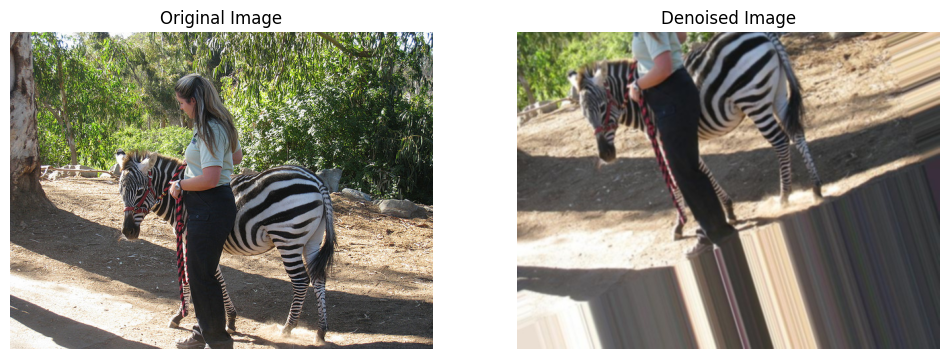

In [ ]:
# Define directories for original and denoised images
original_dir = "/content/drive/MyDrive/30124033/WildAfrica/WildAfrica"
denoised_dir = "/content/drive/MyDrive/30124033/WildAfrica_processed/Denoised"

def display_sample_images(original_path, denoised_path):
    """
    Displays the original and denoised images side by side.
    """
    original_img = cv2.imread(original_path)
    denoised_img = cv2.imread(denoised_path)

    # Check if images are loaded correctly
    if original_img is None:
        print(f"Error: Could not load original image from {original_path}")
        return
    if denoised_img is None:
        print(f"Error: Could not load denoised image from {denoised_path}")
        return

    # Convert images from BGR to RGB for display
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    denoised_img = cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB)

    # Display images side by side
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(denoised_img)
    plt.title("Denoised Image")
    plt.axis("off")

    plt.show()

# Get a list of all categories (subfolders) in the original directory
categories = [
    d for d in os.listdir(original_dir)
    if os.path.isdir(os.path.join(original_dir, d))
]

# Display sample images for each category
for category in categories:
    original_category_dir = os.path.join(original_dir, category)
    denoised_category_dir = os.path.join(denoised_dir, category)

    # Get a list of image files in the original category directory
    image_files = [
        f for f in os.listdir(original_category_dir)
        if f.lower().endswith(('.png', '.jpg', '.jpeg'))
    ]

    # Get a list of denoised files for matching
    denoised_files = os.listdir(denoised_category_dir)

    # Select a few sample images (up to 3)
    sample_images = image_files[:3]

    for image_file in sample_images:
        # Original file path
        original_image_path = os.path.join(original_category_dir, image_file)

        # Find corresponding denoised file
        base_name = os.path.splitext(image_file)[0]  # Get '002' from '002.jpg'
        matching_denoised_files = [
            f for f in denoised_files if f.startswith(base_name)
        ]

        if not matching_denoised_files:
            print(f"No matching denoised file found for {image_file}")
            continue

        # Use the first matching file (if multiple exist)
        denoised_image_path = os.path.join(denoised_category_dir, matching_denoised_files[0])

        # Debugging outputs
        print(f"Original Image Path: {original_image_path}")
        print(f"Denoised Image Path: {denoised_image_path}")

        # Display original and denoised images
        display_sample_images(original_image_path, denoised_image_path)


**Image Resizing and Normalization**

Resize all images to a consistent size (IMG_SIZE) and normalize pixel values to the range [0, 1].

In [ ]:
def resize_and_normalize(image_path, target_size=(128, 128)):
    # Resize the image to a fixed target size and normalize pixel values.#
    img = load_img(image_path, target_size=target_size)  # Resize
    img_array = img_to_array(img) / 255.0  # Normalize to range [0, 1]
    return img_array

def process_dataset(input_dir, output_dir, target_size=(128, 128)):
    # Process the entire dataset: resize and normalize all images.#
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for subfolder in os.listdir(input_dir):
        subfolder_path = os.path.join(input_dir, subfolder)
        if os.path.isdir(subfolder_path):  # Check if it's a directory
            # Create corresponding subfolder in output directory
            output_subfolder = os.path.join(output_dir, subfolder)
            os.makedirs(output_subfolder, exist_ok=True)

            for filename in os.listdir(subfolder_path):
                if filename.endswith(('.png', '.jpg', '.jpeg')):
                    image_path = os.path.join(subfolder_path, filename)
                    processed_img = resize_and_normalize(image_path, target_size)
                    output_path = os.path.join(output_subfolder, filename)
                    save_img(output_path, processed_img)

# Call the function
input_directory = "/content/drive/MyDrive/30124033/WildAfrica_processed/Denoised"
resized_output_directory = "/content/drive/MyDrive/30124033/WildAfrica_processed/Resized"
process_dataset(input_directory, resized_output_directory)

**Display Sample resized images**

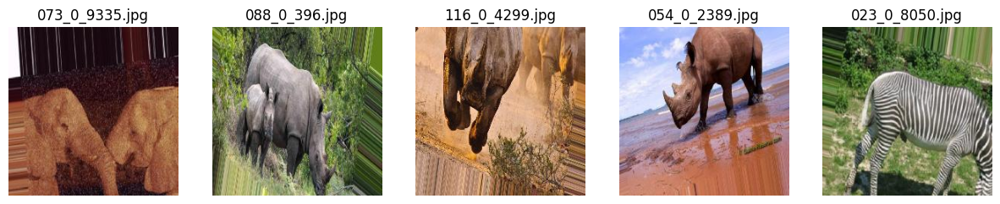

In [ ]:
# Visualizing Sample Output After Resizing and Normalization

import random

def visualize_resized_images(dataset_dir, num_images=5):
    # Visualize random resized images from the dataset.
    all_image_paths = []
    for subdir, dirs, files in os.walk(dataset_dir):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                all_image_paths.append(os.path.join(subdir, file))

    selected_images = random.sample(all_image_paths, num_images)

    plt.figure(figsize=(15, 5))
    for i, img_path in enumerate(selected_images):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.title(os.path.basename(img_path))  # Display filename as title
        plt.axis('off')
    plt.show()

# Call the function
resized_output_directory = "/content/drive/MyDrive/30124033/WildAfrica_processed/Resized"
visualize_resized_images(resized_output_directory)

**Display Sample Resized and Normalized Images**

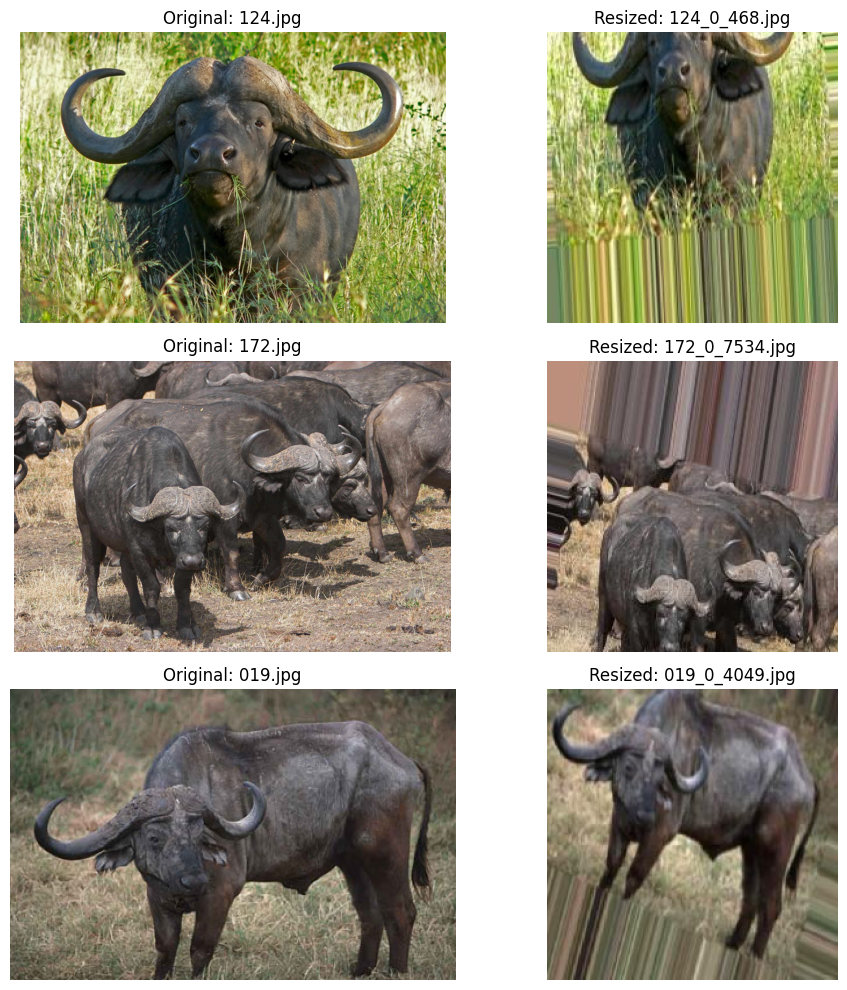

In [ ]:
import random

def match_resized_with_original(original_dir, resized_dir):
    """
     Matches resized images to original images based on shared filename prefixes.

    Parameters:
        original_dir (str): Directory containing original images.
        resized_dir (str): Directory containing resized images.

    Returns:
        List of tuples: [(original_image_path, resized_image_path), ...]
    """
    original_images = {}
    for file in os.listdir(original_dir):
        if file.endswith(('.png', '.jpg', '.jpeg')):
            base_name = os.path.splitext(file)[0]
            original_images[base_name] = os.path.join(original_dir, file)

    matched_pairs = []
    for file in os.listdir(resized_dir):
        if file.endswith(('.png', '.jpg', '.jpeg')):
            base_name = os.path.splitext(file)[0]
            original_prefix = base_name.split('_')[0]  # Extract the prefix before "_"
            if original_prefix in original_images:
                matched_pairs.append((original_images[original_prefix], os.path.join(resized_dir, file)))

    return matched_pairs

def visualize_sample_images(matched_pairs, num_samples=3):
    """
    Visualizes a set number of matched original and resized image pairs.

    Parameters:
        matched_pairs (list): List of (original_image_path, resized_image_path).
        num_samples (int): Number of pairs to visualize.
    """
    if len(matched_pairs) < num_samples:
        print("Not enough matching images to visualize.")
        return

    selected_pairs = random.sample(matched_pairs, num_samples)

    plt.figure(figsize=(10, 10))
    for i, (original_path, resized_path) in enumerate(selected_pairs):
        # Load images
        original_img = cv2.imread(original_path)
        resized_img = cv2.imread(resized_path)

        # Convert to RGB
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
        resized_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB)

        # Display images
        plt.subplot(num_samples, 2, i * 2 + 1)
        plt.imshow(original_img)
        plt.title(f"Original: {os.path.basename(original_path)}")
        plt.axis('off')

        plt.subplot(num_samples, 2, i * 2 + 2)
        plt.imshow(resized_img)
        plt.title(f"Resized: {os.path.basename(resized_path)}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Specify buffalo directories
original_buffalo_dir = "/content/drive/MyDrive/30124033/WildAfrica/WildAfrica/buffalo"
resized_buffalo_dir = "/content/drive/MyDrive/30124033/WildAfrica_processed/Resized/buffalo"

# Match and visualize
matched_pairs = match_resized_with_original(original_buffalo_dir, resized_buffalo_dir)
visualize_sample_images(matched_pairs)




# **Model Testing**

I did some modifications in the given blackbox code

In [ ]:
from sklearn.model_selection import train_test_split

def load_images_from_directory(base_dir, img_size=128):
    """
    Load images and their labels from a directory structure.

    Parameters:
    - base_dir: Path to the root directory containing class subdirectories.
    - img_size: Size to which each image will be resized.

    Returns:
    - labeled_data: List of tuples (image, label), where `image` is a resized image array
      and `label` is the class index.
    """
    labeled_data = []
    class_labels = os.listdir(base_dir)  # Get class subdirectories
    class_labels.sort()  # Ensure consistent labeling order

    for label_idx, class_name in enumerate(class_labels):
        class_path = os.path.join(base_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        # Iterate through all images in the class folder
        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)

            # Load the image
            img = cv2.imread(image_path)
            if img is not None:
                # Resize the image
                img_resized = cv2.resize(img, (img_size, img_size))
                labeled_data.append((img_resized, label_idx))  # Append as (image, label)

    return labeled_data

# Path to the dataset
base_dir = "/content/drive/MyDrive/30124033/WildAfrica_processed/Resized"

# Load images and labels
IMG_SIZE = 128
labeled_data = load_images_from_directory(base_dir, IMG_SIZE)

# Check loaded data
print(f"Loaded {len(labeled_data)} samples.")
print("Example:", labeled_data[0])  # Print the first sample


Loaded 2415 samples.
Example: (array([[[ 20, 197, 184],
        [ 39, 185, 176],
        [ 15, 121, 115],
        ...,
        [ 75,  97, 102],
        [ 77,  96, 104],
        [ 78,  94, 107]],

       [[ 20, 197, 183],
        [ 40, 186, 177],
        [ 14, 120, 115],
        ...,
        [ 75,  97, 102],
        [ 77,  96, 104],
        [ 78,  94, 107]],

       [[ 19, 196, 183],
        [ 41, 187, 178],
        [ 13, 119, 114],
        ...,
        [ 75,  97, 102],
        [ 77,  96, 104],
        [ 78,  94, 107]],

       ...,

       [[ 58, 158, 162],
        [ 58, 162, 165],
        [ 62, 177, 179],
        ...,
        [  9,  17,  17],
        [ 11,  16,  17],
        [  9,  14,  15]],

       [[ 46, 153, 156],
        [ 61, 168, 170],
        [ 46, 157, 159],
        ...,
        [  7,  15,  15],
        [  8,  13,  14],
        [ 11,  16,  17]],

       [[ 42, 152, 154],
        [ 48, 158, 160],
        [ 54, 165, 167],
        ...,
        [  9,  17,  17],
        [  7,  12,

**Unpack Images and Labels**

Convert the labeled_data into two separate lists: X (images) and y (labels).

Separating features (X) and labels (y) ensures compatibility with preprocessing steps, simplifies the training process, and enhances code readability.

In [ ]:
# Unpack images and labels
X, y = zip(*labeled_data)  # Split into separate lists
X = np.array(X)  # Convert list of images to a NumPy array
y = np.array(y)  # Convert labels to a NumPy array

# Normalize images
X = X / 255.0  # Scale pixel values to [0, 1]

# Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


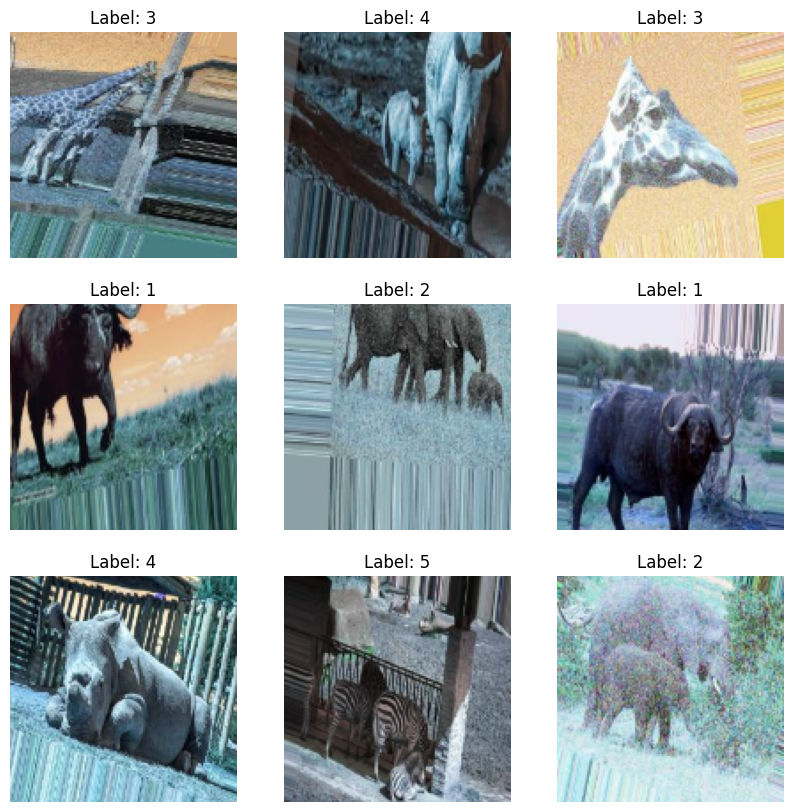

In [ ]:

# Display some sample images
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(X_train[i])
    plt.title(f"Label: {y_train[i]}")
    plt.axis('off')
plt.show()


In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))  # Assuming 10 classes

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))


Epoch 1/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 68s 1s/step - accuracy: 0.3016 - loss: 1.7269 - val_accuracy: 0.3789 - val_loss: 1.3693
Epoch 2/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 61s 989ms/step - accuracy: 0.4731 - loss: 1.2548 - val_accuracy: 0.4762 - val_loss: 1.1815
Epoch 3/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 80s 955ms/step - accuracy: 0.5668 - loss: 1.0249 - val_accuracy: 0.5362 - val_loss: 1.0890
Epoch 4/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 84s 982ms/step - accuracy: 0.6519 - loss: 0.8602 - val_accuracy: 0.6149 - val_loss: 0.9929
Epoch 5/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 81s 979ms/step - accuracy: 0.7574 - loss: 0.6516 - val_accuracy: 0.5839 - val_loss: 1.0871
Epoch 6/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 85s 1s/step - accuracy: 0.7915 - loss: 0.5551 - val_accuracy: 0.6128 - val_loss: 1.2542
Epoch 7/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 77s 947ms/step - accuracy: 0.8637 - loss: 0.3806 - val_accuracy: 0.5839 - val_loss: 1.2763
Epoch 8/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 84s 988ms/step - accuracy: 0.9290 - loss: 0.2293 - val_accuracy: 

In [ ]:
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')


16/16 - 5s - 327ms/step - accuracy: 0.6025 - loss: 1.8895

Test accuracy: 0.6024844646453857


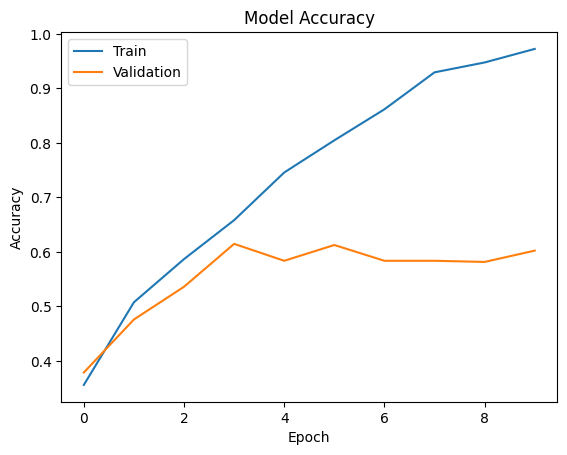

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
